In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import glasbey
import seaborn as sns

import time
import pickle
import memory_profiler

%load_ext memory_profiler
from pathlib import Path

In [2]:
import black
import jupyter_black

jupyter_black.load(line_length=79)

In [3]:
# FIX VSCODE PATH PROBLEM -- DELETE AFTER
import sys

# add path
sys.path.append(
    "/gpfs01/berens/user/rgonzalesmarquez/phd/chatgpt-excess-words/scripts/"
)
print(sys.path)

['/.pyenv/versions/miniconda3-latest/lib/python312.zip', '/.pyenv/versions/miniconda3-latest/lib/python3.12', '/.pyenv/versions/miniconda3-latest/lib/python3.12/lib-dynload', '', '/gpfs01/berens/user/rgonzalesmarquez/.local/lib/python3.12/site-packages', '/gpfs01/berens/user/rgonzalesmarquez/phd/pubmed-landscape', '/gpfs01/berens/user/rgonzalesmarquez/phd/text-embeddings', '/.pyenv/versions/miniconda3-latest/lib/python3.12/site-packages', '/.pyenv/versions/miniconda3-latest/lib/python3.12/site-packages/setuptools/_vendor', '/gpfs01/berens/user/rgonzalesmarquez/phd/chatgpt-excess-words/scripts/']


In [4]:
%load_ext autoreload
%autoreload 2

from process_pubmed_utils import plot_tsne_colors

In [12]:
variables_path = Path("../results/variables")
figures_path = Path("../figures/tmp")
berenslab_data_path = Path("/gpfs01/berens/data/data/pubmed_processed")

In [14]:
# MANUAL FIX TO PATH ISSUE FROM VSCODE

nb_path = Path(
    "/gpfs01/berens/user/rgonzalesmarquez/phd/chatgpt-excess-words/scripts"
)
assert nb_path.exists(), "The path does not exist"

variables_path = (nb_path / variables_path).resolve(strict=True)
figures_path = (nb_path / figures_path).resolve(strict=True)

In [16]:
plt.style.use((nb_path / Path("mpl_style.txt")).resolve(strict=True))

# Import data

In [18]:
%%time
%%memit

df = pd.read_csv(berenslab_data_path / "pubmed_baseline_2025.zip")

peak memory: 56589.99 MiB, increment: 55999.11 MiB
CPU times: user 7min 39s, sys: 29.7 s, total: 8min 9s
Wall time: 8min 9s


In [19]:
df.tail()

,PMID,Title,AbstractText,Journal,Year,Labels,Countries,InferredGenderFirstAuthor,InferredGenderLastAuthor
24814131,999992,Relationship between basal body temperature an...,Continuous measures of arm movement activity a...,Biological psychology,1976,psychology,unknown,unknown,unknown
24814132,999993,Characteristics of a neural clock regulating p...,A biological clock regulating some psychomotor...,Biological psychology,1976,psychology,unknown,unknown,unknown
24814133,999994,Interindividual differences in circadian patte...,Interindividual differences in circadian rhyth...,Biological psychology,1976,psychology,unknown,unknown,unknown
24814134,999995,Catecholamine correlates of radar monitoring p...,Two experiments were concluded in which target...,Biological psychology,1976,psychology,unknown,unknown,unknown
24814135,999996,Electrodermal conditioning to potentially phob...,There are clear sex differences in incidence o...,Biological psychology,1976,psychology,unknown,unknown,unknown


In [50]:
abstracts = df["AbstractText"][(df.Year >= 2022) & (df.Year <= 2024)]
labels = df.Labels[(df.Year >= 2022) & (df.Year <= 2024)]
countries = df.Countries[(df.Year >= 2022) & (df.Year <= 2024)]
years = df.Year[(df.Year >= 2022) & (df.Year <= 2024)]

In [26]:
tsne_sep = np.load(
    variables_path / "tsne_sep.npy",
)

# t-SNE

(-120.0, 120.0, -120.0, 120.0)

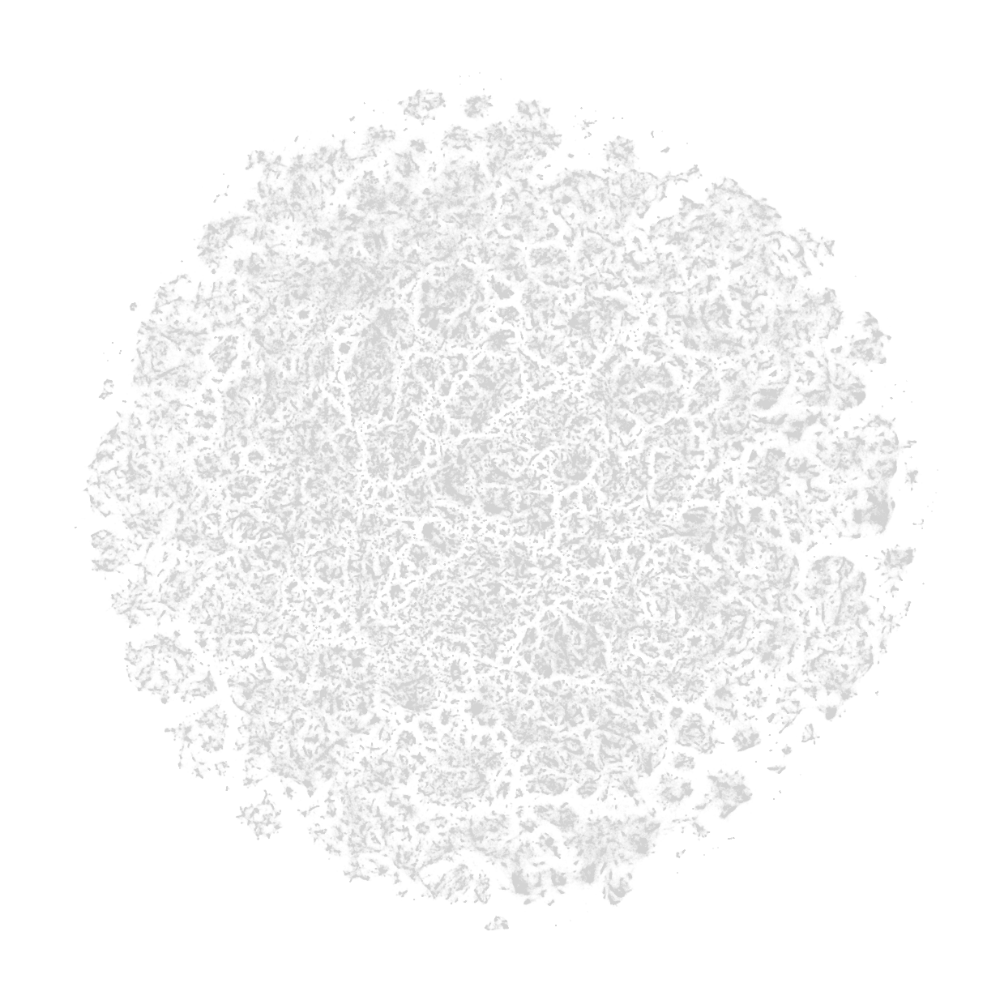

In [29]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(4, 4), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

# subplot b
x_lim = (-120, 120)
y_lim = (-120, 120)

s_grey = 0.5
alpha_grey = 0.02
s_color = 0.5
alpha_color = 0.1

tsne = tsne_sep
# all
ax.scatter(
    *tsne.T,
    c="lightgrey",
    s=s_grey,
    alpha=alpha_grey,
    marker=".",
    linewidths=0,
    rasterized=True,
    ec="None",
)

ax.axis("equal")
ax.set_xlim(x_lim[0], x_lim[1])
ax.set_ylim(y_lim[0], y_lim[1])
ax.axis("off")

# fig.savefig(figures_path / "tsne_mask_rare_words_2022_v1.png")

## Colors based on class

In [30]:
label_color_legend = {
    "cancer": "black",
    "neuroscience": "#aeaa00",
    "cardiology": "#1CE6FF",
    "ecology": "#FF34FF",
    "bioinformatics": "#FF4A46",
    "chemistry": "#008941",
    "surgery": "#006FA6",
    "environment": "#0089A3",
    "material": "#0000A6",
    "microbiology": "#B79762",
    "pediatric": "#004D43",
    "immunology": "#8FB0FF",
    "psychology": "#5A0007",
    "psychiatry": "#BA0900",
    "genetics": "#1B4400",
    "nutrition": "#4FC601",
    "veterinary": "#3B5DFF",
    "engineering": "#00C2A0",
    "education": "#549E79",
    "physics": "#BC23FF",
    "optics": "#C895C5",
    "nursing": "#FF2F80",
    "neurology": "#009271",
    "radiology": "#00FECF",
    "ophthalmology": "#A4E804",
    "gynecology": "#FFB500",
    "rehabilitation": "#6B002C",
    "pathology": "#FF9408",
    "anesthesiology": "#CC0744",
    "dermatology": "#D790FF",
    "pharmacology": "#5B4534",
    "physiology": "#E83000",
    "virology": "#6F0062",
    "biochemistry": "#b65141",
    "computation": "#C20078",
    "infectious": "#7A4900",
    "healthcare": "#FF90C9",
    "ethics": "#6508ba",
    "dentistry": "#8e4d8a",
}

In [33]:
# mapping
# create colors
colors_class = np.vectorize(label_color_legend.get)(labels)

# add grey to the rest of papers
colors_class = np.where(colors_class == None, "lightgrey", colors_class)
colors_class = np.where(colors_class == "None", "lightgrey", colors_class)

# change 0 for 'unlabeled'
labels_with_unlabeled = np.where(
    colors_class == "lightgrey", "unlabeled", labels
)

(4109080, 2)


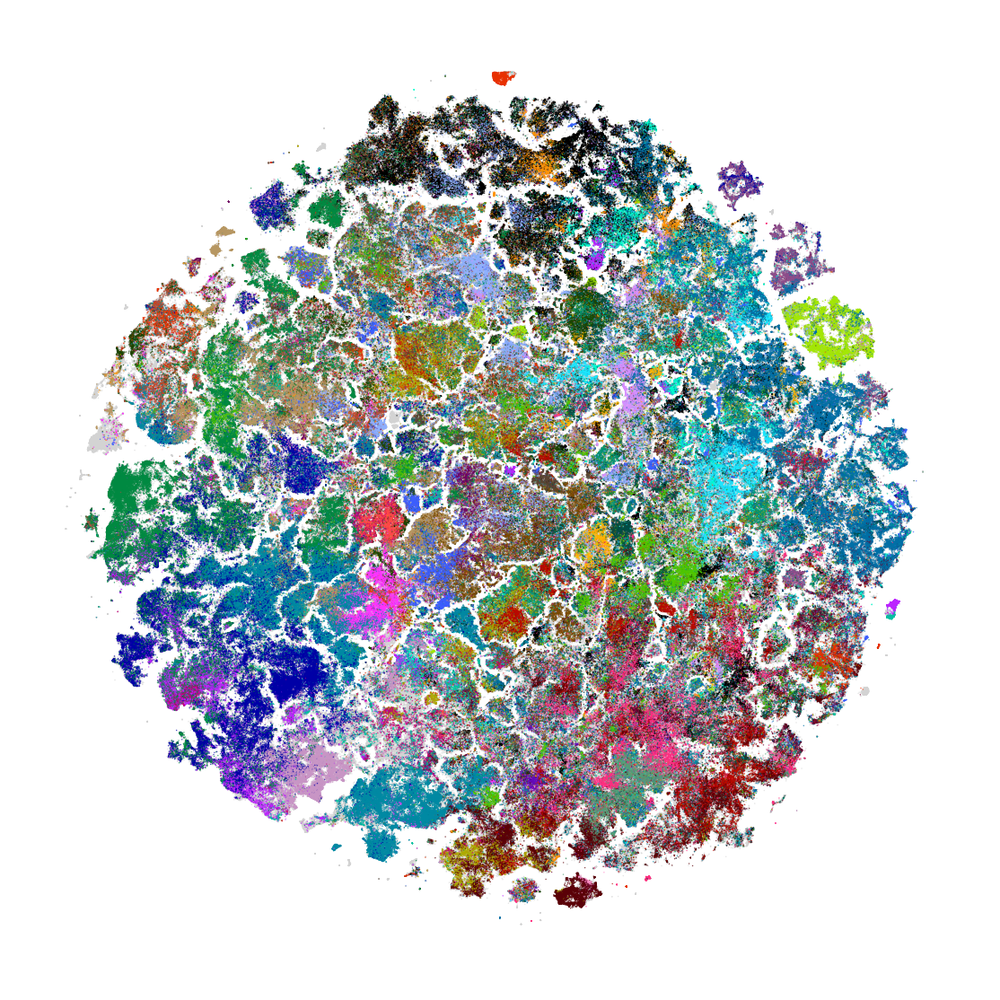

In [38]:
fig, ax = plt.subplots(figsize=(3.6, 3.6), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

x_lim = (-120, 120)
y_lim = (-120, 120)
tsne = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T

# subplot a
plot_tsne_colors(
    tsne,
    colors_class,
    x_lim=x_lim,
    y_lim=y_lim,
    ax=ax,
    # plot_type="subplot_2",
)

fig.savefig(figures_path / "tsne_22-24_colored_by_class.png")

## Colors based on country

In [39]:
country_color_legend = {
    "United States": "#1869ff",
    "China": "#d21820",
    "Japan": "#008a00",
    "United Kingdom": "#f36dff",
    "Germany": "#710079",
    "Italy": "#eba600",
    "Canada": "#00bec2",
    "France": "#45ef3d",
    "India": "#714900",
    "Australia": "#a2aeff",
}

In [40]:
# mapping
# create colors
colors_country = np.vectorize(country_color_legend.get)(countries)

# add grey to the rest of papers
colors_country = np.where(colors_country == None, "lightgrey", colors_country)
colors_country = np.where(
    colors_country == "None", "lightgrey", colors_country
)

# change 0 for 'unlabeled'
labels_with_unlabeled = np.where(
    colors_country == "lightgrey", "unlabeled", countries
)

In [46]:
%%time

# this makes all other countries in dark grey ("#474747") and the unknown ones in grey
colors_country_with_others = np.where(
    colors_country == "lightgrey",
    "#474747",
    colors_country,
)
colors_country_with_others = np.where(
    countries == "unknown",
    "lightgrey",
    colors_country_with_others,
)

CPU times: user 353 ms, sys: 1.99 ms, total: 355 ms
Wall time: 355 ms


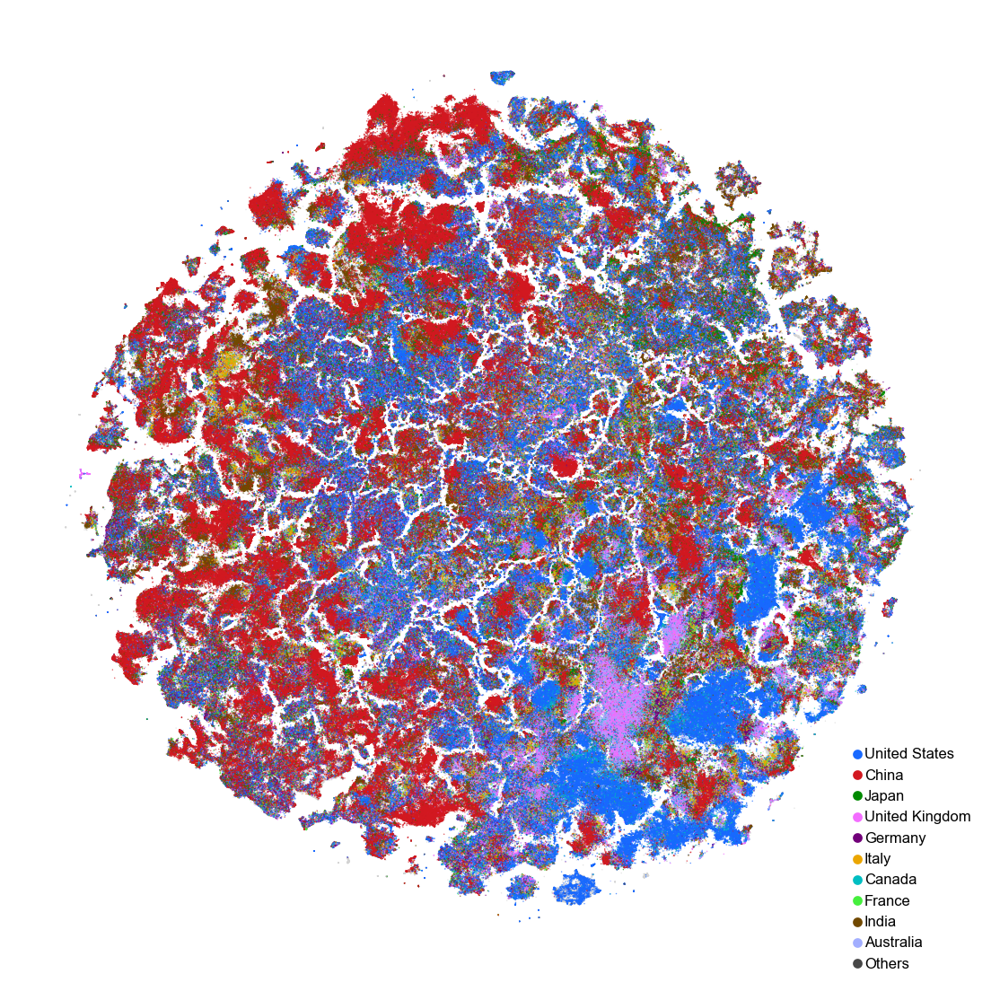

In [48]:
fig, ax = plt.subplots(figsize=(3.6, 3.6), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

x_lim = (-120, 120)
y_lim = (-120, 120)

tsne = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T


# subplot a
plot_tsne_colors(
    tsne,
    colors_country,
    x_lim=x_lim,
    y_lim=y_lim,
    ax=ax,
    # plot_type="subplot_2",
)

all_keys = []
for key, value in country_color_legend.items():
    key = ax.scatter([], [], c=value, s=10, alpha=1, label=key)
    all_keys.append(key)

key = ax.scatter([], [], c="#474747", s=10, alpha=1, label="Others")
all_keys.append(key)
ax.legend(
    handles=all_keys,
    loc="lower right",
    fontsize=4,
    frameon=False,
    borderpad=0.2,
    handletextpad=0,
    handlelength=1,
    borderaxespad=-0.2,
)

fig.savefig(figures_path / "tsne_22-24_colored_by_country.png")

# Sets of words

In [21]:
chatgptwords_common = [
    "exhibited",
    "crucial",
    "additionally",
    "within",
    "notably",
    "insights",
    "comprehensive",
    "across",
    "particularly",
    "enhancing",
]

chatgptwords_rare = [
    "accentuates",
    "acknowledges",
    "acknowledging",
    "addresses",
    "adept",
    "adhered",
    "adhering",
    "advancement",
    "advancements",
    "advancing",
    "advocates",
    "advocating",
    "affirming",
    "afflicted",
    "aiding",
    "akin",
    "align",
    "aligning",
    "aligns",
    "alongside",
    "amidst",
    "assessments",
    "attains",
    "attributed",
    "augmenting",
    "avenue",
    "avenues",
    "bolster",
    "bolstered",
    "bolstering",
    "broader",
    "burgeoning",
    "capabilities",
    "capitalizing",
    "categorized",
    "categorizes",
    "categorizing",
    "combating",
    "commendable",
    "compelling",
    "complicates",
    "complicating",
    "comprehending",
    "comprising",
    "consequently",
    "consolidates",
    "contributing",
    "conversely",
    "correlating",
    "crafted",
    "crafting",
    "culminating",
    "customizing",
    "delineates",
    "delve",
    "delved",
    "delves",
    "delving",
    "demonstrating",
    "dependability",
    "dependable",
    "detailing",
    "detrimentally",
    "diminishes",
    "diminishing",
    "discern",
    "discerned",
    "discernible",
    "discerning",
    "displaying",
    "disrupts",
    "distinctions",
    "distinctive",
    "elevate",
    "elevates",
    "elevating",
    "elucidate",
    "elucidates",
    "elucidating",
    "embracing",
    "emerges",
    "emphasises",
    "emphasising",
    "emphasize",
    "emphasizes",
    "emphasizing",
    "employing",
    "employs",
    "empowers",
    "emulating",
    "emulation",
    "enabling",
    "encapsulates",
    "encompass",
    "encompassed",
    "encompasses",
    "encompassing",
    "endeavors",
    "endeavours",
    "enduring",
    "enhancements",
    "enhances",
    "ensuring",
    "equipping",
    "escalating",
    "evaluates",
    "evolving",
    "exacerbating",
    "examines",
    "exceeding",
    "excels",
    "exceptional",
    "exceptionally",
    "exerting",
    "exhibiting",
    "exhibits",
    "expedite",
    "expediting",
    "exploration",
    "explores",
    "facilitated",
    "facilitates",
    "facilitating",
    "featuring",
    "formidable",
    "fostering",
    "fosters",
    "foundational",
    "furnish",
    "garnered",
    "garnering",
    "gauged",
    "grappling",
    "groundbreaking",
    "groundwork",
    "harness",
    "harnesses",
    "harnessing",
    "heighten",
    "heightened",
    "hinder",
    "hinges",
    "hinting",
    "hold",
    "holds",
    "illuminates",
    "illuminating",
    "imbalances",
    "impacting",
    "impede",
    "impeding",
    "imperative",
    "impressive",
    "inadequately",
    "incorporates",
    "incorporating",
    "influencing",
    "inherent",
    "initially",
    "innovative",
    "inquiries",
    "integrates",
    "integrating",
    "integration",
    "interconnectedness",
    "interplay",
    "intricacies",
    "intricate",
    "intricately",
    "introduces",
    "invaluable",
    "investigates",
    "involves",
    "juxtaposed",
    "leverages",
    "leveraging",
    "maintaining",
    "merges",
    "methodologies",
    "meticulous",
    "meticulously",
    "multifaceted",
    "necessitate",
    "necessitates",
    "necessitating",
    "necessity",
    "notable",
    "noteworthy",
    "nuanced",
    "nuances",
    "offering",
    "optimizing",
    "orchestrating",
    "outlines",
    "overlook",
    "overlooking",
    "paving",
    "persist",
    "pinpoint",
    "pinpointed",
    "pinpointing",
    "pioneering",
    "pioneers",
    "pivotal",
    "poised",
    "pose",
    "posed",
    "poses",
    "posing",
    "predominantly",
    "preserving",
    "pressing",
    "promise",
    "pronounced",
    "propelling",
    "realm",
    "realms",
    "recognizing",
    "refine",
    "refines",
    "refining",
    "remarkable",
    "renowned",
    "revealing",
    "reveals",
    "revolutionize",
    "revolutionizing",
    "revolves",
    "scrutinize",
    "scrutinized",
    "scrutinizing",
    "seamless",
    "seamlessly",
    "seeks",
    "serves",
    "serving",
    "shaping",
    "shedding",
    "showcased",
    "showcases",
    "showcasing",
    "signifying",
    "solidify",
    "spanned",
    "spanning",
    "spurred",
    "stands",
    "stemming",
    "strategically",
    "streamline",
    "streamlined",
    "streamlines",
    "streamlining",
    "struggle",
    "substantiated",
    "substantiates",
    "surged",
    "surmount",
    "surpass",
    "surpassed",
    "surpasses",
    "surpassing",
    "swift",
    "swiftly",
    "thorough",
    "transformative",
    "typically",
    "ultimately",
    "uncharted",
    "uncovering",
    "underexplored",
    "underscore",
    "underscored",
    "underscores",
    "underscoring",
    "unexplored",
    "unlocking",
    "unparalleled",
    "unraveling",
    "unveil",
    "unveiled",
    "unveiling",
    "unveils",
    "uphold",
    "upholding",
    "urging",
    "utilizes",
    "varying",
    "versatility",
    "warranting",
    "yielding",
]

In [22]:
def find_mask_list_words(abstracts, list_word, verbose=True):
    """Creates a mask for abstracts containing at least one word of the list."""

    pattern = r"\b(?:" + "|".join(list_word) + r")\b"
    mask = abstracts.str.contains(pattern, case=False).to_numpy()

    if verbose == True:
        print(
            f"Number of papers with at least one of the words: ", np.sum(mask)
        )

    return mask

## Rare words

In [23]:
%%time
mask_rare_words = find_mask_list_words(abstracts, chatgptwords_rare)
np.save(variables_path / "mask_rare_words", mask_rare_words)

Number of papers with at least one of the words:  1921674
CPU times: user 1h 9min 35s, sys: 3.07 s, total: 1h 9min 38s
Wall time: 1h 9min 47s


### 2024

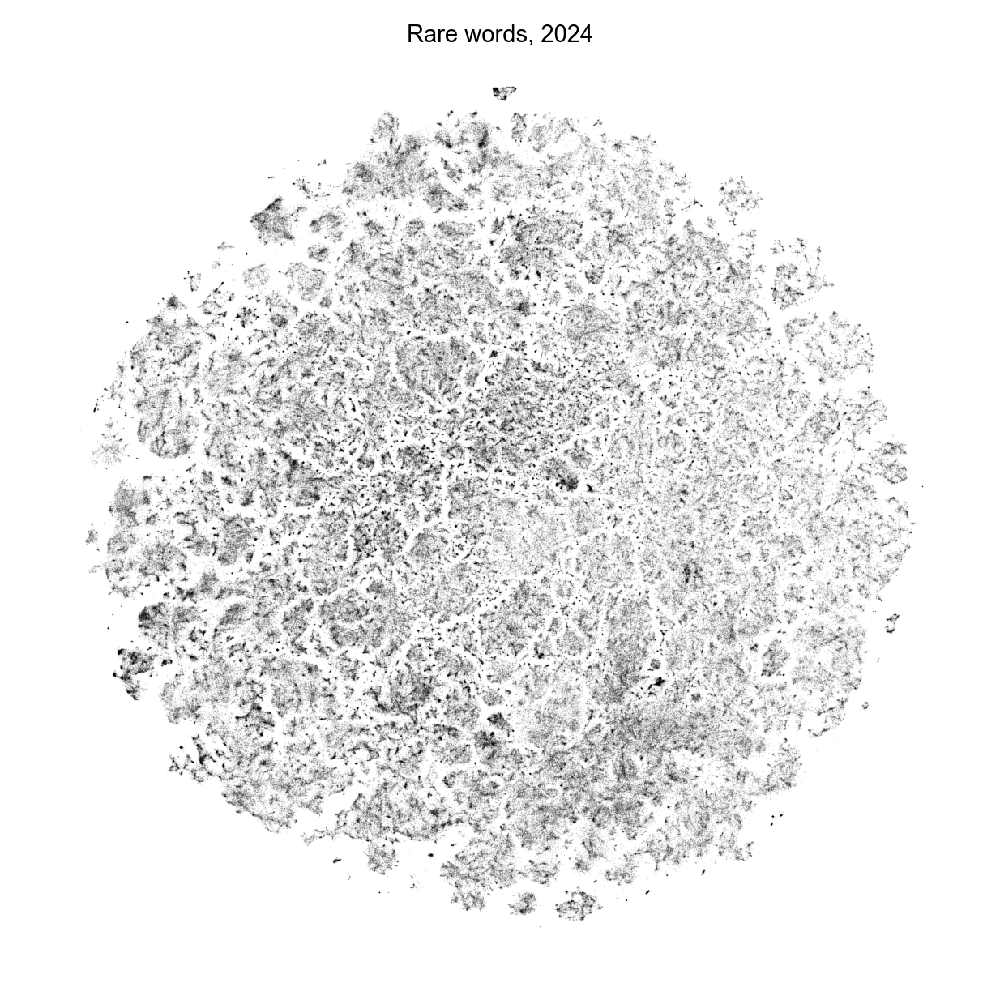

In [51]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(4, 4), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

# subplot b
x_lim = (-120, 120)
y_lim = (-120, 120)

s_grey = 0.5
alpha_grey = 0.02
s_color = 0.5
alpha_color = 0.1

tsne = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T

# all
# ax.scatter(
#     *tsne.T,
#     c="lightgrey",
#     s=s_grey,
#     alpha=alpha_grey,
#     marker=".",
#     linewidths=0,
#     rasterized=True,
#     ec="None",
# )


ax.scatter(
    *tsne[(mask_rare_words) & (years == 2024)].T,
    s=s_color,
    c="black",
    alpha=alpha_color,
    marker=".",
    linewidths=0,
    rasterized=True,
)


ax.set_title("Rare words, 2024")
ax.axis("equal")
ax.set_xlim(x_lim[0], x_lim[1])
ax.set_ylim(y_lim[0], y_lim[1])
ax.axis("off")

fig.savefig(figures_path / "tsne_mask_rare_words_2024_v1.png")

### 2022

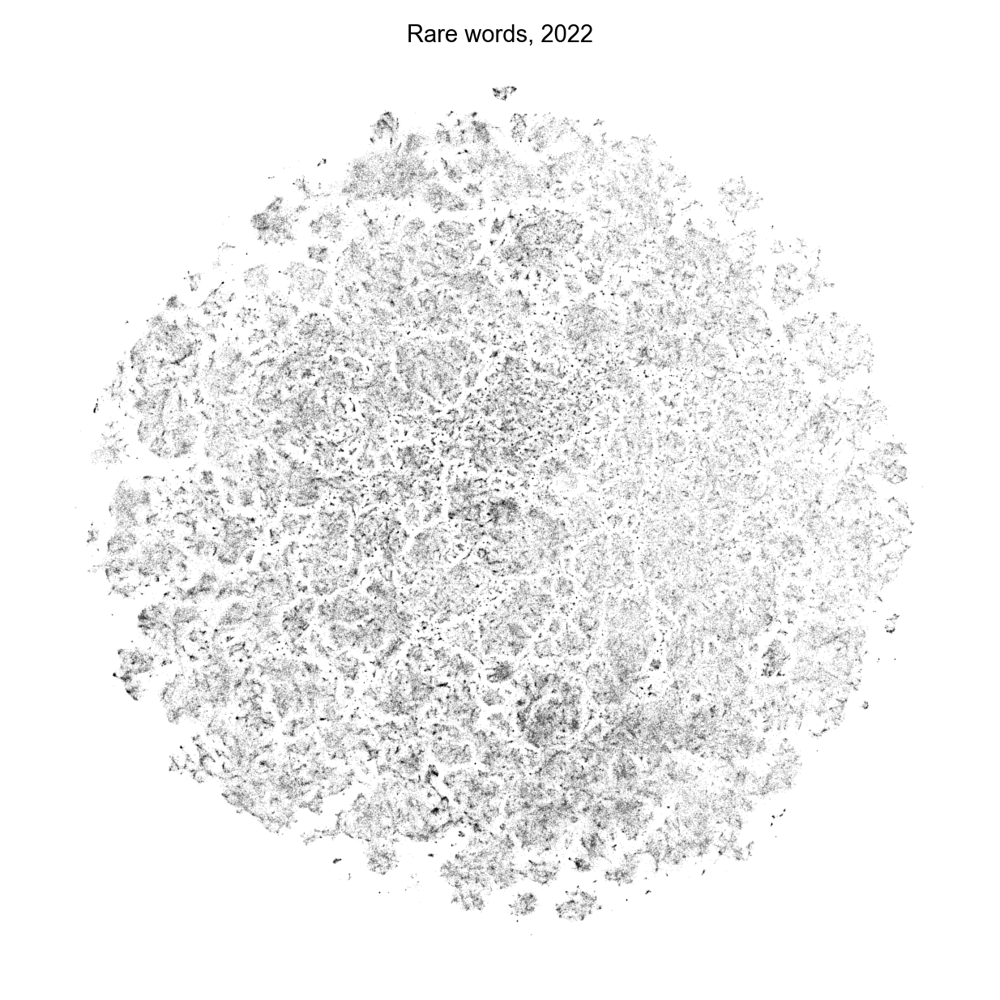

In [52]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(4, 4), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

# subplot b
x_lim = (-120, 120)
y_lim = (-120, 120)

s_grey = 0.5
alpha_grey = 0.02
s_color = 0.5
alpha_color = 0.1

tsne = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T

# all
# ax.scatter(
#     *tsne.T,
#     c="lightgrey",
#     s=s_grey,
#     alpha=alpha_grey,
#     marker=".",
#     linewidths=0,
#     rasterized=True,
#     ec="None",
# )


ax.scatter(
    *tsne[(mask_rare_words) & (years == 2022)].T,
    s=s_color,
    c="black",
    alpha=alpha_color,
    marker=".",
    linewidths=0,
    rasterized=True,
)


ax.set_title("Rare words, 2022")
ax.axis("equal")
ax.set_xlim(x_lim[0], x_lim[1])
ax.set_ylim(y_lim[0], y_lim[1])
ax.axis("off")

fig.savefig(figures_path / "tsne_mask_rare_words_2022_v1.png")

## Common words

In [25]:
%%time
mask_common_words = find_mask_list_words(abstracts, chatgptwords_common)
np.save(variables_path / "mask_common_words", mask_common_words)

Number of papers with at least one of the words:  1537552
CPU times: user 3min 44s, sys: 2.18 s, total: 3min 46s
Wall time: 3min 47s


### 2024

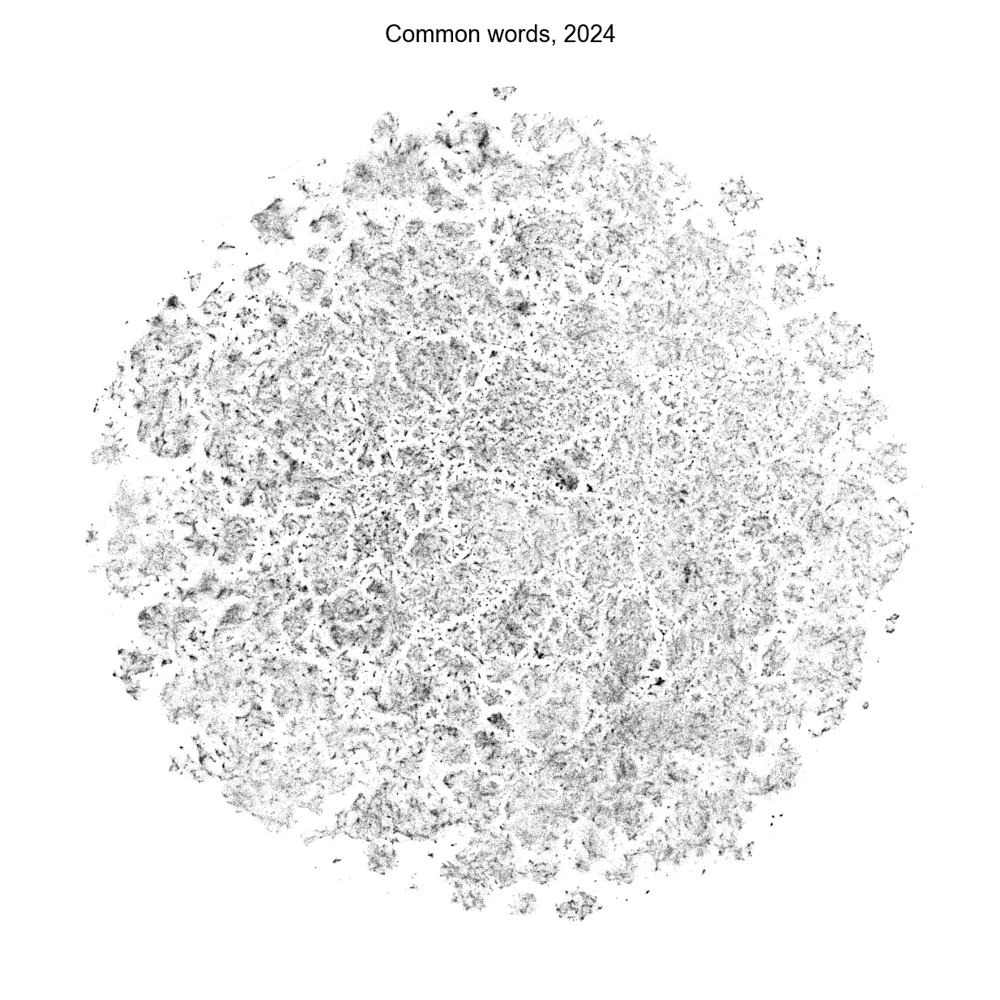

In [53]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(4, 4), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

# subplot b
x_lim = (-120, 120)
y_lim = (-120, 120)

s_grey = 0.5
alpha_grey = 0.02
s_color = 0.5
alpha_color = 0.1

tsne = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T

# all
# ax.scatter(
#     *tsne.T,
#     c="lightgrey",
#     s=s_grey,
#     alpha=alpha_grey,
#     marker=".",
#     linewidths=0,
#     rasterized=True,
#     ec="None",
# )


ax.scatter(
    *tsne[(mask_common_words) & (years == 2024)].T,
    s=s_color,
    c="black",
    alpha=alpha_color,
    marker=".",
    linewidths=0,
    rasterized=True,
)


ax.set_title("Common words, 2024")
ax.axis("equal")
ax.set_xlim(x_lim[0], x_lim[1])
ax.set_ylim(y_lim[0], y_lim[1])
ax.axis("off")

fig.savefig(figures_path / "tsne_mask_common_words_2024_v1.png")

### 2022

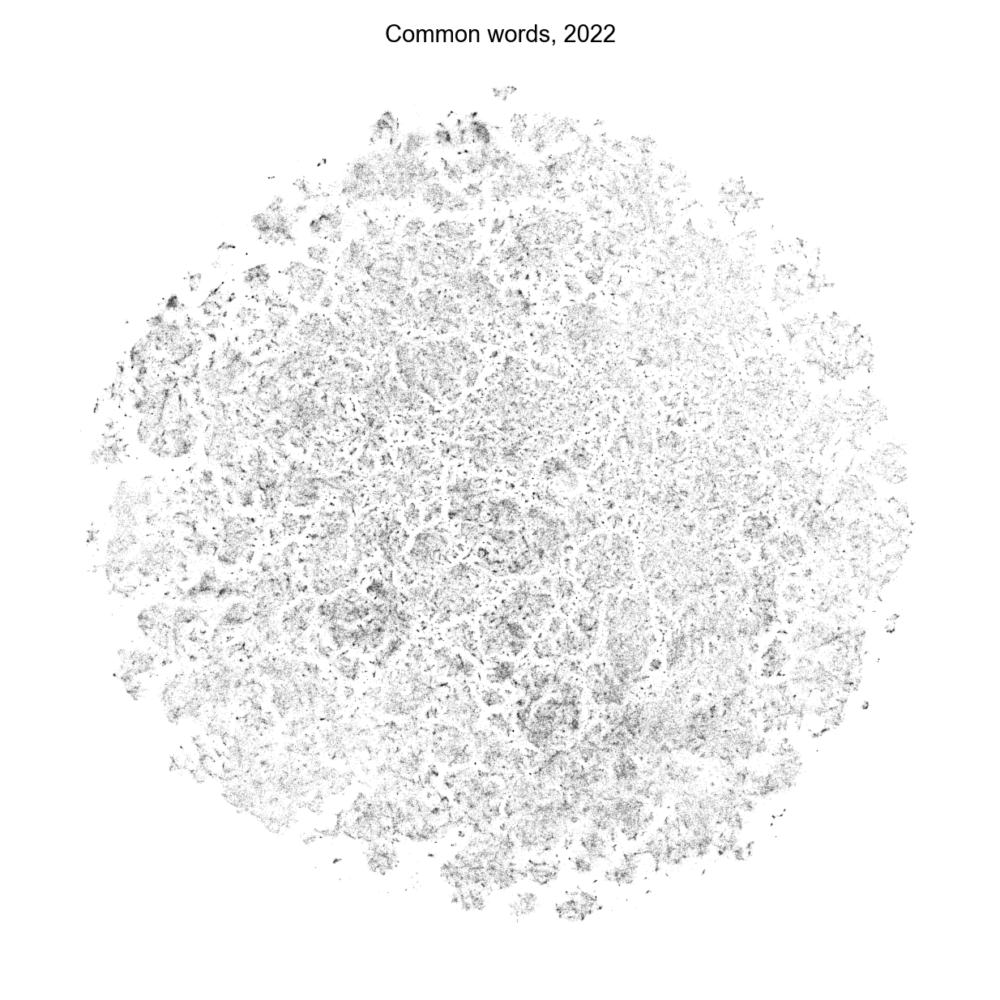

In [54]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(4, 4), dpi=300, layout="constrained")

txtkwargs = dict(size=8, weight="bold", va="top", ha="left")

# subplot b
x_lim = (-120, 120)
y_lim = (-120, 120)

s_grey = 0.5
alpha_grey = 0.02
s_color = 0.5
alpha_color = 0.1

tsne = np.vstack((-tsne_sep[:, 0], -tsne_sep[:, 1])).T

# all
# ax.scatter(
#     *tsne.T,
#     c="lightgrey",
#     s=s_grey,
#     alpha=alpha_grey,
#     marker=".",
#     linewidths=0,
#     rasterized=True,
#     ec="None",
# )


ax.scatter(
    *tsne[(mask_common_words) & (years == 2022)].T,
    s=s_color,
    c="black",
    alpha=alpha_color,
    marker=".",
    linewidths=0,
    rasterized=True,
)


ax.set_title("Common words, 2022")
ax.axis("equal")
ax.set_xlim(x_lim[0], x_lim[1])
ax.set_ylim(y_lim[0], y_lim[1])
ax.axis("off")

fig.savefig(figures_path / "tsne_mask_common_words_2022_v1.png")

# Dataframe

Only including papers from 2022-2024

PMID, x, y, country, colors, class, color, journal, year, contains_rare, contains_common

In [55]:
df_tsne = df[["PMID", "Year", "Journal", "Labels", "Countries"]][
    (df.Year >= 2022) & (df.Year <= 2024)
].copy(deep=True)

In [56]:
df_tsne["x"] = tsne_sep[:, 0]
df_tsne["y"] = tsne_sep[:, 1]

In [57]:
df_tsne["contains_rare"] = mask_rare_words

In [58]:
df_tsne["contains_common"] = mask_common_words

In [59]:
df_tsne["colors_class"] = colors_class

In [60]:
df_tsne["colors_country"] = colors_country_with_others

In [61]:
df_tsne.head()

,PMID,Year,Journal,Labels,Countries,x,y,contains_rare,contains_common,colors_class,colors_country
3759007,17111134,2023,Applied microbiology and biotechnology,microbiology,China,41.336465,-14.301695,False,False,#B79762,#d21820
3862195,17245552,2023,Molecular biology reports,unlabeled,China,30.471647,-21.530552,False,False,lightgrey,#d21820
6423822,20960239,2024,Applied biochemistry and biotechnology,biochemistry,China,61.087884,-31.224746,False,True,#b65141,#d21820
6442209,21028883,2022,Biochemistry,biochemistry,Denmark,52.883743,-36.074506,True,False,#b65141,#474747
6841810,21544554,2024,Applied biochemistry and biotechnology,biochemistry,China,61.388757,-32.332601,False,True,#b65141,#d21820


In [62]:
%%time
compression_opts = dict(method="zip", archive_name="df_tsne_22-24.csv")

df_tsne.to_csv(
    berenslab_data_path / "df_tsne_22-24.zip",
    index=False,
    compression=compression_opts,
)

CPU times: user 34.3 s, sys: 101 ms, total: 34.4 s
Wall time: 34.5 s
